In [1]:
import pandas as pd
import yfinance as yf

url = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
tickers = pd.read_html(io=url)[0]['Symbol'].to_list()

tickers = [t.replace('.', '-') for t in tickers]
tickers[:5]

def get_data(tickers, index, start, end, file):
    (
        yf.download(tickers=tickers, start=start, end=end)
        ['Adj Close']
        .pct_change()
        .join(
            other=(
                
                yf.download(tickers=index, start='1900-01-01', end=end)
                [['Close']]
                .rename(columns={'Close': index})
            ),
            how='outer'
        )
        .to_csv(file)
    )

get_data(tickers=tickers, index='^GSPC', start='1980-01-01', end='2023-12-31', file='sp500.csv')

sp500 = (
    pd.read_csv(
        filepath_or_buffer='sp500.csv',
        parse_dates=['Date'],
        index_col=['Date']
    )
    .rename_axis(columns='Ticker')
)

sp500.iloc[-5:, -5:].pipe(display)

[*********************100%%**********************]  503 of 503 completed
[*********************100%%**********************]  1 of 1 completed


Ticker,YUM,ZBH,ZBRA,ZTS,^GSPC
Date,,,,,
2023-12-22,0.000154,0.007605,0.015454,0.001644,4754.629883
2023-12-26,0.002000,0.009142,0.022605,0.002667,4774.750000
2023-12-27,0.004453,-0.002388,0.001053,0.007161,4781.580078
2023-12-28,-0.002446,0.004128,-0.001595,0.001320,4783.350098
2023-12-29,0.001073,0.000576,-0.007336,0.001065,4769.830078


In [3]:
import pandas as pd


gspc_close = sp500['^GSPC']

peaks = []
troughs = []
is_seeking_trough = False
peak_price = gspc_close.iloc[0]
trough_price = peak_price

for date, price in gspc_close.items():
    if not is_seeking_trough:
        
        if price > peak_price:
            peak_price = price
            peak_date = date
        elif price <= peak_price * 0.8:
            
            peaks.append((peak_date, peak_price))
            is_seeking_trough = True
            trough_price = price
            trough_date = date
    else:
        
        if price < trough_price:
            trough_price = price
            trough_date = date
        elif price >= trough_price * 1.2:
            
            troughs.append((trough_date, trough_price))
            is_seeking_trough = False
            peak_price = price
            peak_date = date

peaks_df = pd.DataFrame(peaks, columns=['Peak Date', 'Peak Price'])
troughs_df = pd.DataFrame(troughs, columns=['Trough Date', 'Trough Price'])


print("Peaks:\n", peaks_df)
print("\nTroughs:\n", troughs_df)


Peaks:
    Peak Date   Peak Price
0 1980-11-28   140.520004
1 1987-08-25   336.769989
2 2000-03-24  1527.459961
3 2002-01-04  1172.510010
4 2007-10-09  1565.150024
5 2009-01-06   934.700012
6 2020-02-19  3386.149902
7 2022-01-03  4796.560059

Troughs:
   Trough Date  Trough Price
0  1982-08-12    102.419998
1  1987-12-04    223.919998
2  2001-09-21    965.799988
3  2002-07-23    797.700012
4  2008-11-20    752.440002
5  2009-03-09    676.530029
6  2020-03-23   2237.399902
7  2022-10-12   3577.030029


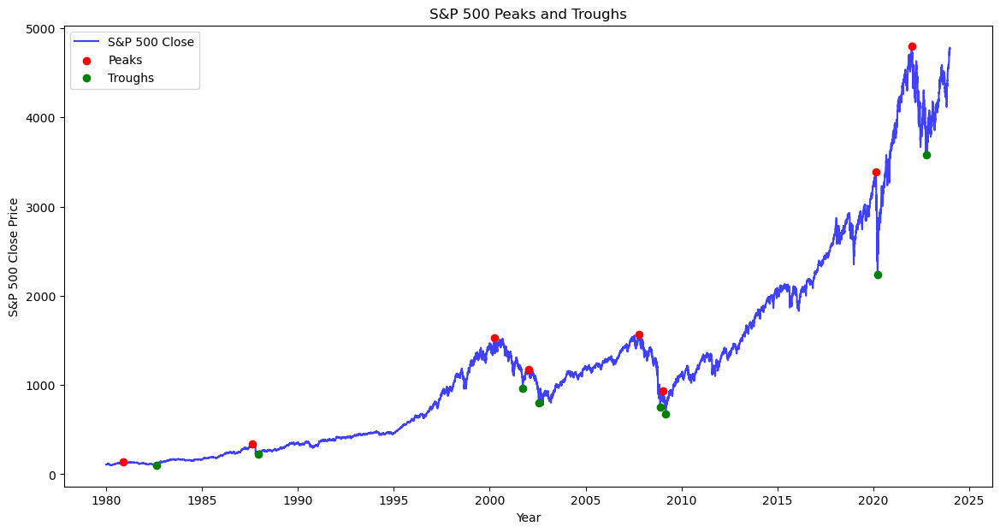

In [4]:
import matplotlib.pyplot as plt
import pandas as pd
peaks_df = pd.DataFrame(peaks, columns=['Date', 'Price']).set_index('Date')
troughs_df = pd.DataFrame(troughs, columns=['Date', 'Price']).set_index('Date')

plt.figure(figsize=(14, 7))
plt.plot(gspc_close.index, gspc_close.values, label='S&P 500 Close', color='blue', alpha=0.75)

plt.scatter(peaks_df.index, peaks_df.Price, color='red', label='Peaks', zorder=5)

plt.scatter(troughs_df.index, troughs_df.Price, color='green', label='Troughs', zorder=5)

plt.title('S&P 500 Peaks and Troughs')
plt.xlabel('Year')
plt.ylabel('S&P 500 Close Price')
plt.legend()
plt.show()


In [5]:
import pandas as pd

sp500 = sp500['1980-01-01':'2023-12-31']

gspc_close = sp500['^GSPC']

peak = gspc_close.iloc[0]
is_in_crisis = False
crisis_start_date = gspc_close.index[0]
crisis_periods = []

for date, price in gspc_close.items():
    if not is_in_crisis:
        peak = max(peak, price)
    current_drawdown = (price - peak) / peak
    if current_drawdown <= -0.20 and not is_in_crisis:
        is_in_crisis = True
        crisis_start_date = date
        trough = price
    if is_in_crisis:
        trough = min(trough, price)
    if is_in_crisis and ((price - trough) / trough) >= 0.20:
        crisis_periods.append((crisis_start_date, date))
        is_in_crisis = False
        peak = price
        trough = price

efficient_crisis_periods_df = pd.DataFrame(crisis_periods, columns=['Crisis Start', 'Crisis End'])

efficient_crisis_periods_df

,Crisis Start,Crisis End
0,1982-02-22,1982-09-14
1,1987-10-19,1988-03-08
2,2001-03-12,2001-12-05
3,2002-07-10,2002-08-22
4,2008-07-09,2008-12-08
5,2009-02-23,2009-03-23
6,2020-03-12,2020-04-08
7,2022-06-13,2023-06-08


In [6]:
peak = sp500['^GSPC'].iloc[0]
is_in_bear_market = False
bear_market_periods = []
bull_market_periods = []


last_bear_market_end = None

for date, price in sp500['^GSPC'].items():
    if not is_in_bear_market:
        
        peak = max(peak, price)
    
    current_decline = (price - peak) / peak
    if current_decline <= -0.20 and not is_in_bear_market:
        
        is_in_bear_market = True
        bear_market_start = date
        trough = price
    elif is_in_bear_market:
        
        trough = min(trough, price)
        current_recovery = (price - trough) / trough
        if current_recovery >= 0.20:
            
            bear_market_periods.append((bear_market_start, date))
            is_in_bear_market = False
            peak = price
            trough = price
            
            last_bear_market_end = date
    elif last_bear_market_end and date > last_bear_market_end:
        
        if not bull_market_periods or bull_market_periods[-1][1] < last_bear_market_end:
            bull_market_periods.append((last_bear_market_end, date))
        else:
            
            bull_market_periods[-1] = (bull_market_periods[-1][0], date)


bear_market_df = pd.DataFrame(bear_market_periods, columns=['Bear Market Start', 'Bear Market End'])
bull_market_df = pd.DataFrame(bull_market_periods, columns=['Bull Market Start', 'Bull Market End'])

bear_market_df, bull_market_df

(  Bear Market Start Bear Market End
 0        1982-02-22      1982-09-14
 1        1987-10-19      1988-03-08
 2        2001-03-12      2001-12-05
 3        2002-07-10      2002-08-22
 4        2008-07-09      2008-12-08
 5        2009-02-23      2009-03-23
 6        2020-03-12      2020-04-08
 7        2022-06-13      2023-06-08,
   Bull Market Start Bull Market End
 0        1982-09-14      1987-10-16
 1        1988-03-08      2001-03-09
 2        2001-12-05      2002-07-09
 3        2002-08-22      2008-07-08
 4        2008-12-08      2009-02-20
 5        2009-03-23      2020-03-11
 6        2020-04-08      2022-06-10
 7        2023-06-08      2023-12-29)

In [7]:
import pandas as pd
crisis_periods = pd.DataFrame({
    'Crisis Start': ['1982-02-22','1987-10-19', '2001-03-12','2002-07-10', '2008-07-09','2009-02-23', '2020-03-12', '2022-06-13'],
    'Crisis End': ['1982-09-14','1988-03-08', '2001-12-05','2002-08-22','2008-12-08','2009-03-23', '2020-04-08', '2023-06-08']
})

crisis_periods['Crisis Start'] = pd.to_datetime(crisis_periods['Crisis Start'])
crisis_periods['Crisis End'] = pd.to_datetime(crisis_periods['Crisis End'])

all_correlations_crisis = {}
all_correlations_non_crisis = {}
betas_crisis_all = {}
betas_non_crisis_all = {}

def calculate_capm_betas(stock_returns, market_returns):
    market_variance = market_returns.var()
    betas = {}
    for stock in stock_returns.columns:
        covariance = stock_returns[stock].cov(market_returns)
        betas[stock] = covariance / market_variance
    return betas

for index, row in crisis_periods.iterrows():
    crisis_start, crisis_end = row['Crisis Start'], row['Crisis End']
    
    non_crisis_start = crisis_start - pd.DateOffset(years=1)
    non_crisis_end = crisis_start - pd.DateOffset(days=1)
    
    crisis_returns = sp500.loc[crisis_start:crisis_end].drop('^GSPC', axis=1)
    non_crisis_returns = sp500.loc[non_crisis_start:non_crisis_end].drop('^GSPC', axis=1)
    market_returns_crisis = sp500.loc[crisis_start:crisis_end, '^GSPC']
    market_returns_non_crisis = sp500.loc[non_crisis_start:non_crisis_end, '^GSPC']
    
    correlation_crisis = crisis_returns.corr()
    correlation_non_crisis = non_crisis_returns.corr()
    all_correlations_crisis[f"Crisis {index+1}"] = correlation_crisis
    all_correlations_non_crisis[f"Non-Crisis {index+1}"] = correlation_non_crisis
    
    betas_crisis = calculate_capm_betas(crisis_returns, market_returns_crisis)
    betas_non_crisis = calculate_capm_betas(non_crisis_returns, market_returns_non_crisis)
    betas_crisis_all[f"Crisis {index+1}"] = betas_crisis
    betas_non_crisis_all[f"Non-Crisis {index+1}"] = betas_non_crisis

print(f"Number of CAPM betas calculated for Crisis 1: {len(betas_crisis_all['Crisis 1'])}")


Number of CAPM betas calculated for Crisis 1: 503


In [8]:
print("Correlation Matrices for Crisis Periods:")
for key, matrix in all_correlations_crisis.items():
    print(f"\n{key}:")
    print(matrix)

print("\nCorrelation Matrices for Non-Crisis Periods:")
for key, matrix in all_correlations_non_crisis.items():
    print(f"\n{key}:")
    print(matrix)


Correlation Matrices for Crisis Periods:

Crisis 1:
Ticker   A  AAL  AAPL  ABBV  ABNB       ABT  ACGL  ACN  ADBE       ADI  ...  \
Ticker                                                                  ...   
A      NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
AAL    NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
AAPL   NaN  NaN   1.0   NaN   NaN  0.434997   NaN  NaN   NaN  0.348164  ...   
ABBV   NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
ABNB   NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
...     ..  ...   ...   ...   ...       ...   ...  ...   ...       ...  ...   
XYL    NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
YUM    NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
ZBH    NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
ZBRA   NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   


In [9]:
print("CAPM Betas for Crisis Periods:")
for key, betas in betas_crisis_all.items():
    print(f"\n{key}:")
    for stock, beta_value in betas.items():
        print(f"{stock}: {beta_value}")

print("\nCAPM Betas for Non-Crisis Periods:")
for key, betas in betas_non_crisis_all.items():
    print(f"\n{key}:")
    for stock, beta_value in betas.items():
        print(f"{stock}: {beta_value}")


CAPM Betas for Crisis Periods:

Crisis 1:
A: nan
AAL: nan
AAPL: 0.00047457638030670593
ABBV: nan
ABNB: nan
ABT: 0.0005274289796824628
ACGL: nan
ACN: nan
ADBE: nan
ADI: 0.0003255171124070565
ADM: 0.00022295018944806756
ADP: 0.0009102232964412957
ADSK: nan
AEE: nan
AEP: -8.468391249347232e-05
AES: nan
AFL: 0.0005419451975163095
AIG: 0.0005820746665960328
AIZ: nan
AJG: nan
AKAM: nan
ALB: nan
ALGN: nan
ALL: nan
ALLE: nan
AMAT: 0.0010425506630840774
AMCR: nan
AMD: 0.0009934163150287427
AME: nan
AMGN: nan
AMP: nan
AMT: nan
AMZN: nan
ANET: nan
ANSS: nan
AON: 0.0004941972558892922
AOS: nan
APA: 0.0012215276260581244
APD: 0.0003717027976084128
APH: nan
APTV: nan
ARE: nan
ATO: nan
AVB: nan
AVGO: nan
AVY: 0.0004115221441624384
AWK: nan
AXON: nan
AXP: 0.0004941502262746104
AZO: nan
BA: 6.669279953183229e-05
BAC: 0.00022487655535192302
BALL: 0.000509261118661794
BAX: 0.0004269875236052588
BBWI: 0.0011129771703932826
BBY: nan
BDX: 0.0003068278314358521
BEN: nan
BF-B: 0.0004791662495685027
BG: nan
BI

In [10]:
for period_type, period_dict in [("Crisis", (all_correlations_crisis, betas_crisis_all)),
                                 ("Non-Crisis", (all_correlations_non_crisis, betas_non_crisis_all))]:
    print(f"\n--- {period_type} Periods ---")
    correlations, betas = period_dict
    for key in correlations.keys():
        print(f"\n{key} Correlation Matrix:")
        print(correlations[key])
        print(f"\n{key} CAPM Betas:")
        betas_dict = betas[key]
        for stock, beta_value in betas_dict.items():
            print(f"{stock}: {beta_value}")



--- Crisis Periods ---

Crisis 1 Correlation Matrix:
Ticker   A  AAL  AAPL  ABBV  ABNB       ABT  ACGL  ACN  ADBE       ADI  ...  \
Ticker                                                                  ...   
A      NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
AAL    NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
AAPL   NaN  NaN   1.0   NaN   NaN  0.434997   NaN  NaN   NaN  0.348164  ...   
ABBV   NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
ABNB   NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
...     ..  ...   ...   ...   ...       ...   ...  ...   ...       ...  ...   
XYL    NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
YUM    NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
ZBH    NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
ZBRA   NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...  

A beta value close to zero suggests that the stock's returns are not strongly correlated with the returns of the overall market. This might indicate that during the time period analyzed, those stocks with numerical beta values displayed little to no systematic risk, or in other words, their price movements were relatively independent of the market's movements.

In [11]:
import numpy as np
from scipy import stats

average_correlation_crisis = []
average_correlation_non_crisis = []
average_beta_crisis = []
average_beta_non_crisis = []

for matrix in all_correlations_crisis.values():
    avg_corr = np.nanmean(matrix.values[np.triu_indices_from(matrix, k=1)])
    if not np.isnan(avg_corr):  
        average_correlation_crisis.append(avg_corr)

for matrix in all_correlations_non_crisis.values():
    avg_corr = np.nanmean(matrix.values[np.triu_indices_from(matrix, k=1)])
    if not np.isnan(avg_corr):  
        average_correlation_non_crisis.append(avg_corr)

for betas in betas_crisis_all.values():
    avg_beta = np.nanmean(list(betas.values()))
    if not np.isnan(avg_beta):  
        average_beta_crisis.append(avg_beta)

for betas in betas_non_crisis_all.values():
    avg_beta = np.nanmean(list(betas.values()))
    if not np.isnan(avg_beta):  
        average_beta_non_crisis.append(avg_beta)

print(f"Average Correlation During Crisis: {np.nanmean(average_correlation_crisis) if average_correlation_crisis else 'Data not available'}")
print(f"Average Correlation During Non-Crisis: {np.nanmean(average_correlation_non_crisis) if average_correlation_non_crisis else 'Data not available'}")
print(f"Average CAPM Beta During Crisis: {np.nanmean(average_beta_crisis) if average_beta_crisis else 'Data not available'}")
print(f"Average CAPM Beta During Non-Crisis: {np.nanmean(average_beta_non_crisis) if average_beta_non_crisis else 'Data not available'}")

if average_correlation_crisis and average_correlation_non_crisis:
    t_test_correlation = stats.ttest_ind(average_correlation_crisis, average_correlation_non_crisis, nan_policy='omit')
    print(f"\nT-Test for Difference in Average Correlation: {t_test_correlation}")
else:
    print("\nInsufficient data for correlation t-test.")

if average_beta_crisis and average_beta_non_crisis:
    t_test_beta = stats.ttest_ind(average_beta_crisis, average_beta_non_crisis, nan_policy='omit')
    print(f"T-Test for Difference in Average CAPM Beta: {t_test_beta}")
else:
    print("Insufficient data for CAPM beta t-test.")


Average Correlation During Crisis: 0.4300903815921806
Average Correlation During Non-Crisis: 0.2850629949360082
Average CAPM Beta During Crisis: 0.0002885660240148925
Average CAPM Beta During Non-Crisis: 3.34417267995755e-05

T-Test for Difference in Average Correlation: TtestResult(statistic=1.8213130541926152, pvalue=0.08999266787576427, df=14.0)
T-Test for Difference in Average CAPM Beta: TtestResult(statistic=2.1878673468984977, pvalue=0.046136915326141156, df=14.0)


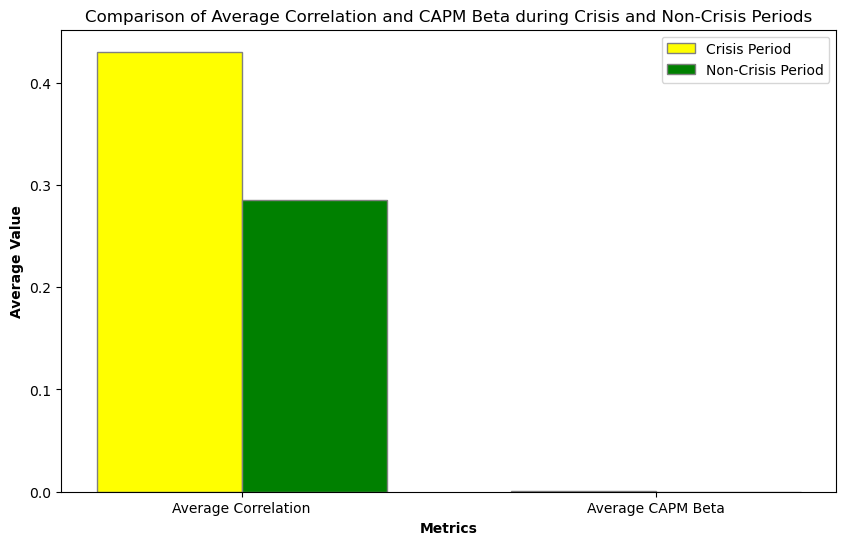

In [12]:
import matplotlib.pyplot as plt
labels = ['Average Correlation', 'Average CAPM Beta']

crisis_data = [np.nanmean(average_correlation_crisis), np.nanmean(average_beta_crisis)]
non_crisis_data = [np.nanmean(average_correlation_non_crisis), np.nanmean(average_beta_non_crisis)]
bar_width = 0.35

r1 = np.arange(len(labels))
r2 = [x + bar_width for x in r1]

plt.figure(figsize=(10, 6))
plt.bar(r1, crisis_data, color='yellow', width=bar_width, edgecolor='grey', label='Crisis Period')
plt.bar(r2, non_crisis_data, color='green', width=bar_width, edgecolor='grey', label='Non-Crisis Period')

plt.xlabel('Metrics', fontweight='bold')
plt.ylabel('Average Value', fontweight='bold')
plt.xticks([r + bar_width/2 for r in range(len(labels))], labels)
plt.title('Comparison of Average Correlation and CAPM Beta during Crisis and Non-Crisis Periods')
plt.legend()

plt.show()


In [13]:
import pandas as pd
crisis_df = pd.DataFrame(crisis_data)
non_crisis_df = pd.DataFrame(non_crisis_data)

crisis_corr_matrix = crisis_df.corr()

non_crisis_corr_matrix = non_crisis_df.corr()

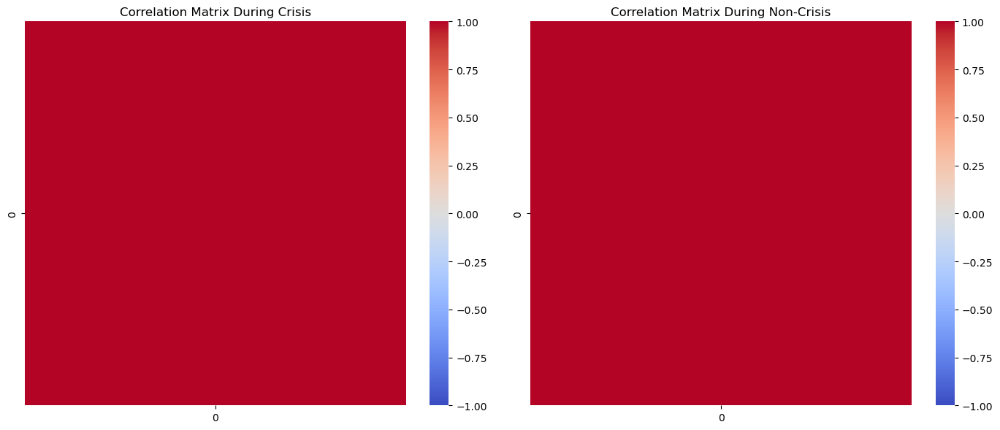

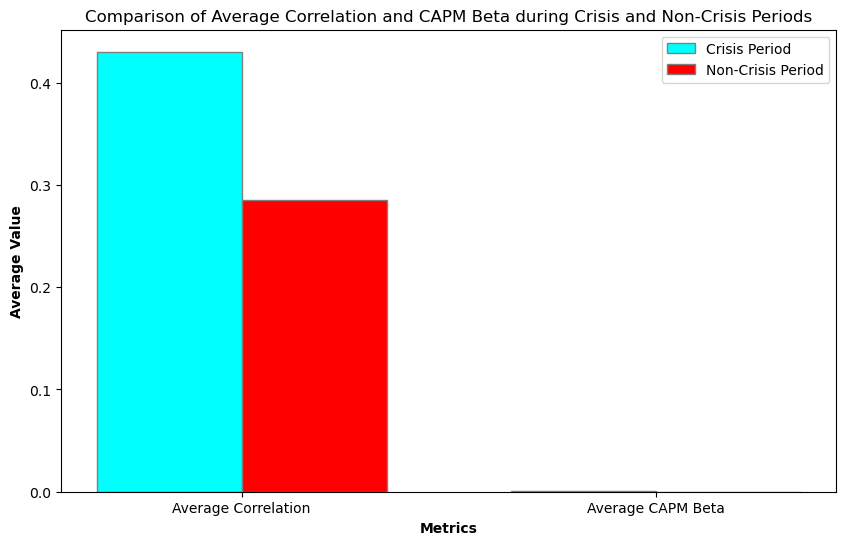

In [14]:
import seaborn as sns
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.heatmap(crisis_corr_matrix, cmap='coolwarm', vmax=1.0, vmin=-1.0)
plt.title('Correlation Matrix During Crisis')

plt.subplot(1, 2, 2)
sns.heatmap(non_crisis_corr_matrix, cmap='coolwarm', vmax=1.0, vmin=-1.0)
plt.title('Correlation Matrix During Non-Crisis')

plt.tight_layout()

plt.show()

labels = ['Average Correlation', 'Average CAPM Beta']
crisis_data = [np.nanmean(average_correlation_crisis), np.nanmean(average_beta_crisis)]
non_crisis_data = [np.nanmean(average_correlation_non_crisis), np.nanmean(average_beta_non_crisis)]

bar_width = 0.35

r1 = np.arange(len(labels))
r2 = [x + bar_width for x in r1]

plt.figure(figsize=(10, 6))
plt.bar(r1, crisis_data, color='cyan', width=bar_width, edgecolor='grey', label='Crisis Period')
plt.bar(r2, non_crisis_data, color='r', width=bar_width, edgecolor='grey', label='Non-Crisis Period')

plt.xlabel('Metrics', fontweight='bold')
plt.ylabel('Average Value', fontweight='bold')
plt.xticks([r + bar_width/2 for r in range(len(labels))], labels)
plt.title('Comparison of Average Correlation and CAPM Beta during Crisis and Non-Crisis Periods')
plt.legend()

plt.show()


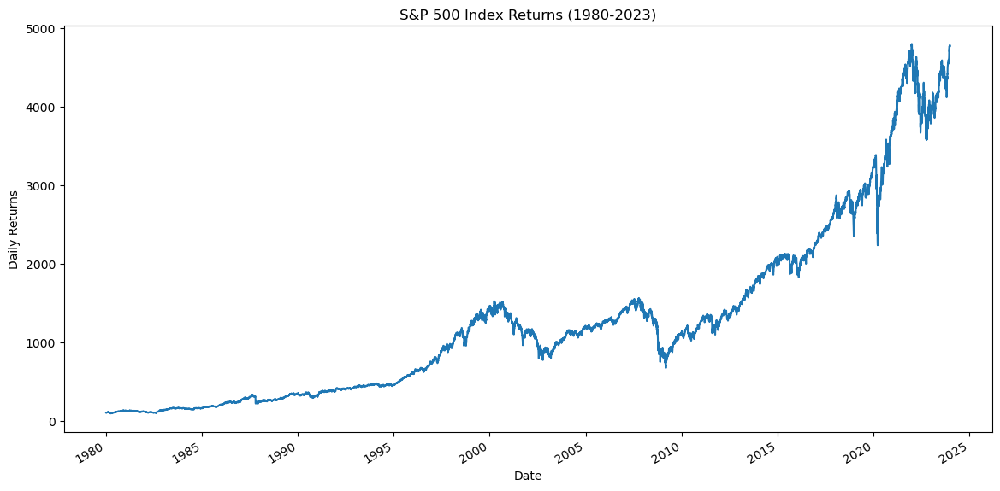

In [15]:
import matplotlib.pyplot as plt


sp500['^GSPC'].plot(figsize=(14, 7), title='S&P 500 Index Returns (1980-2023)')
plt.ylabel('Daily Returns')
plt.show()


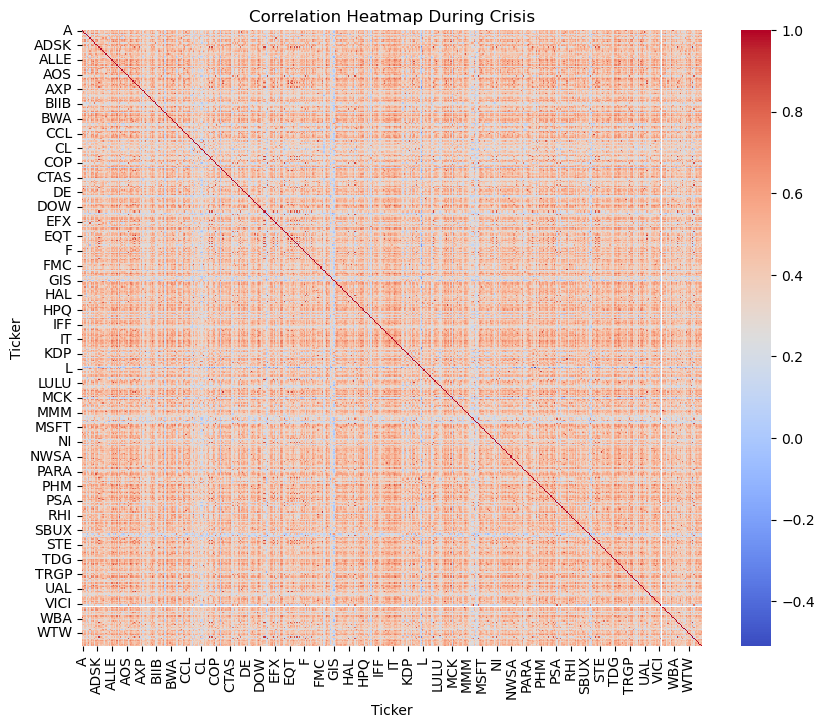

In [16]:
import seaborn as sns

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_crisis, annot=False, cmap='coolwarm', cbar=True)
plt.title('Correlation Heatmap During Crisis')
plt.show()


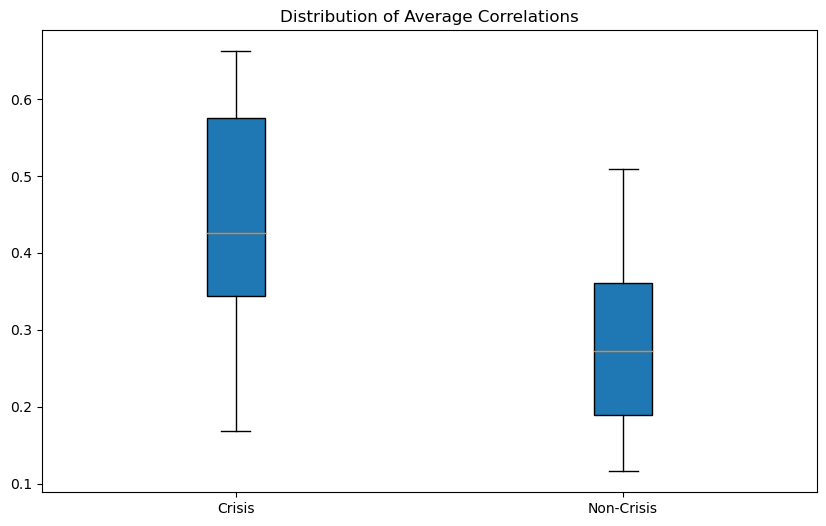

In [17]:

data_to_plot = [average_correlation_crisis, average_correlation_non_crisis]
plt.figure(figsize=(10, 6))
plt.boxplot(data_to_plot, patch_artist=True)
plt.xticks([1, 2], ['Crisis', 'Non-Crisis'])
plt.title('Distribution of Average Correlations')
plt.show()


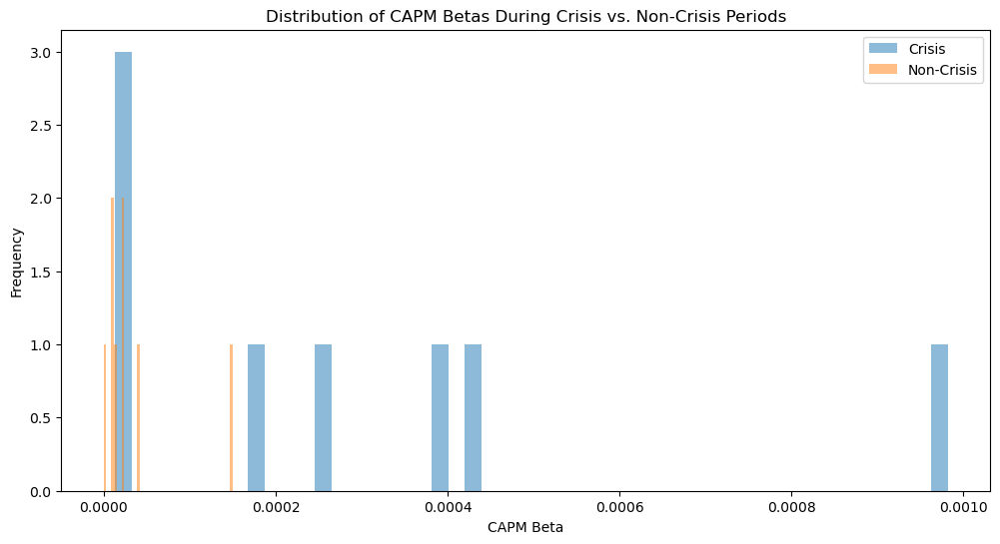

In [18]:
plt.figure(figsize=(12, 6))
plt.hist(average_beta_crisis, bins=50, alpha=0.5, label='Crisis')
plt.hist(average_beta_non_crisis, bins=50, alpha=0.5, label='Non-Crisis')
plt.xlabel('CAPM Beta')
plt.ylabel('Frequency')
plt.legend()
plt.title('Distribution of CAPM Betas During Crisis vs. Non-Crisis Periods')
plt.show()


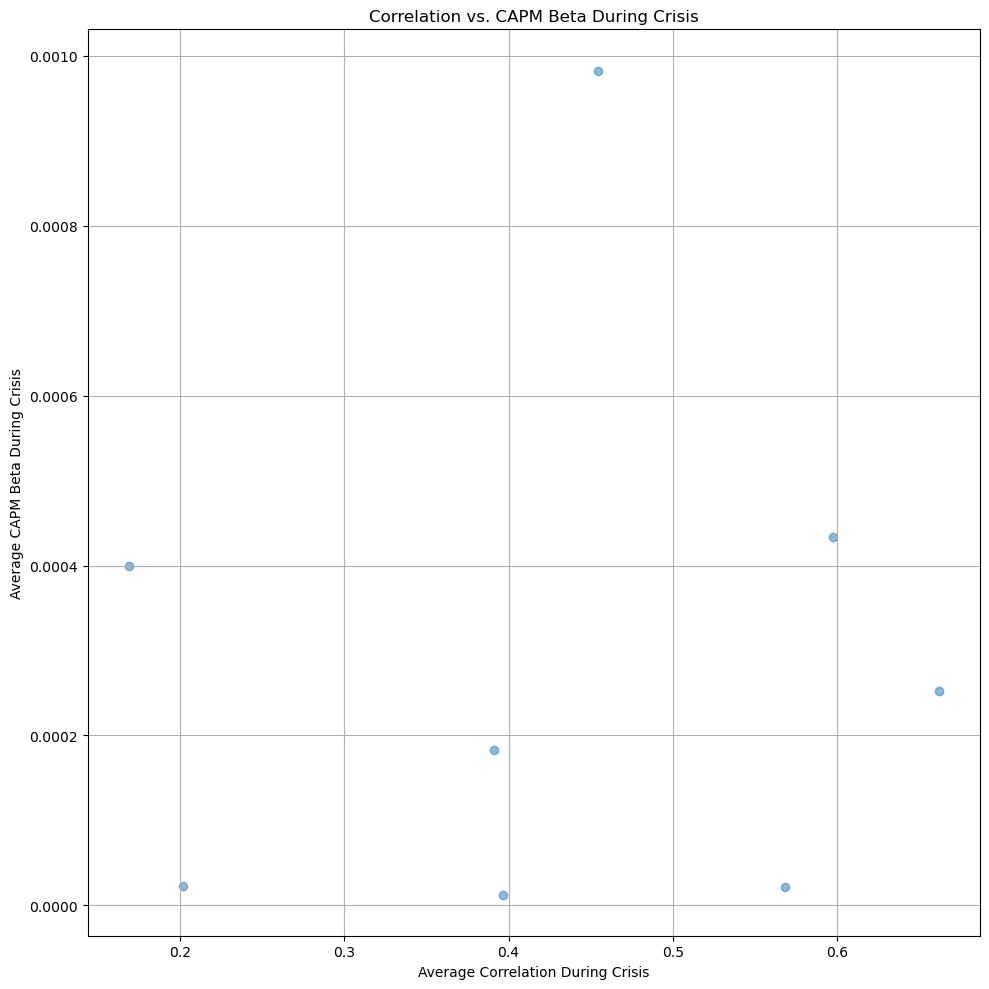

In [19]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
plt.scatter(average_correlation_crisis, average_beta_crisis, alpha=0.5)
plt.xlabel('Average Correlation During Crisis')
plt.ylabel('Average CAPM Beta During Crisis')
plt.title('Correlation vs. CAPM Beta During Crisis')
plt.grid(True)  
plt.tight_layout()  
plt.show()


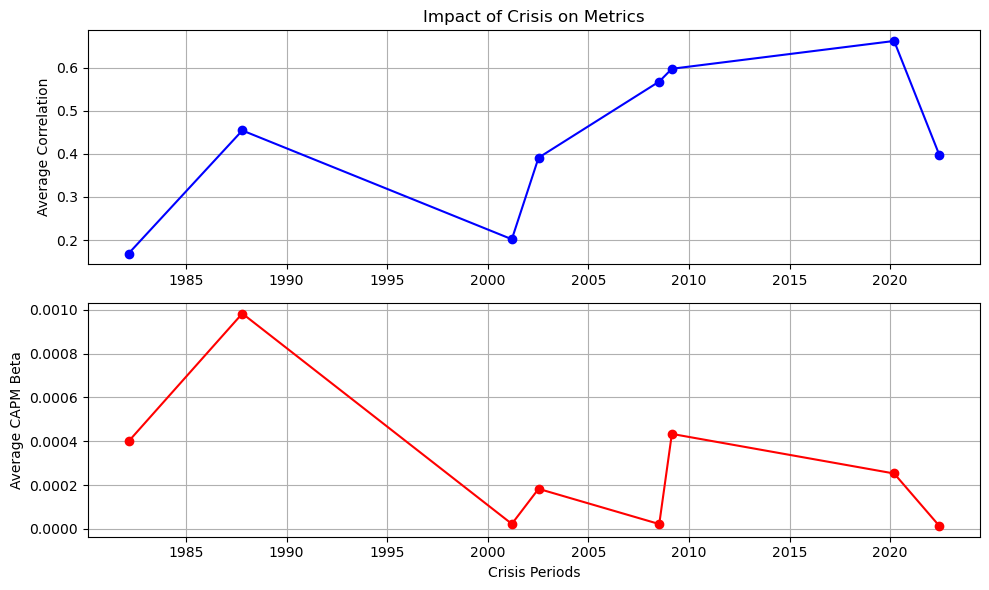

In [20]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

plt.subplot(2, 1, 1)  
plt.plot(crisis_periods['Crisis Start'], average_correlation_crisis, marker='o', linestyle='-', color='b')
plt.title('Impact of Crisis on Metrics')
plt.ylabel('Average Correlation')
plt.grid(True)

plt.subplot(2, 1, 2) 
plt.plot(crisis_periods['Crisis Start'], average_beta_crisis, marker='o', linestyle='-', color='r')
plt.xlabel('Crisis Periods')
plt.ylabel('Average CAPM Beta')
plt.grid(True)

plt.tight_layout() 
plt.show()


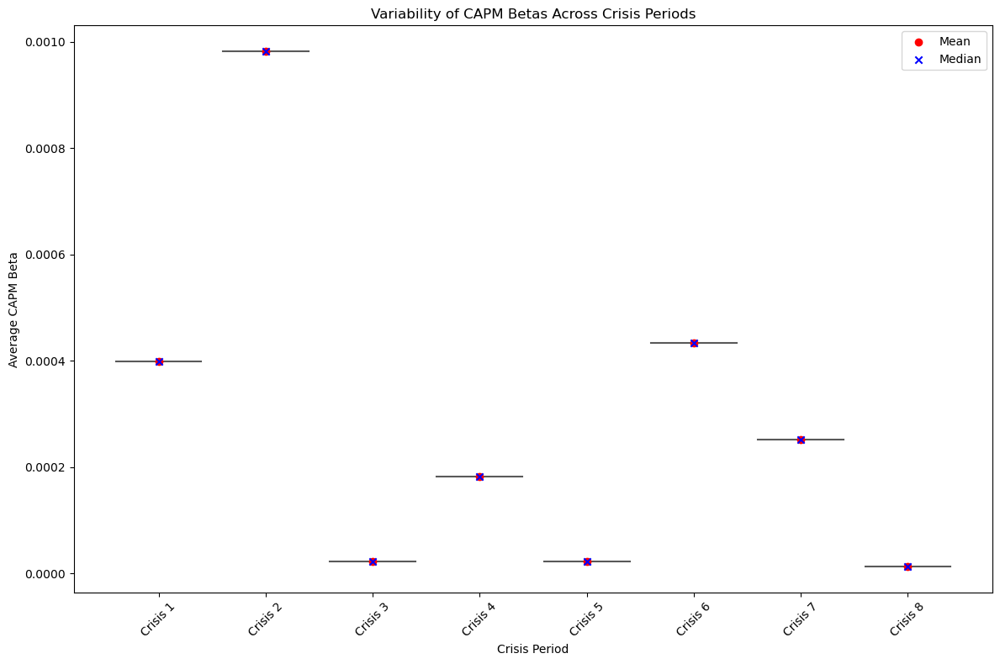

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

crisis_betas_data = {
    'Crisis Period': [f'Crisis {i+1}' for i in range(len(average_beta_crisis))],
    'Average CAPM Beta': average_beta_crisis
}
crisis_betas_df = pd.DataFrame(crisis_betas_data)
plt.figure(figsize=(12, 8))
sns.violinplot(x='Crisis Period', y='Average CAPM Beta', data=crisis_betas_df, inner="quartile", linewidth=1.5, palette="Set2")

mean_betas = crisis_betas_df.groupby('Crisis Period')['Average CAPM Beta'].mean().values
plt.scatter(x=range(len(mean_betas)), y=mean_betas, color='red', marker='o', label='Mean', zorder=3)
median_betas = crisis_betas_df.groupby('Crisis Period')['Average CAPM Beta'].median().values
plt.scatter(x=range(len(median_betas)), y=median_betas, color='blue', marker='x', label='Median', zorder=3)
q1 = crisis_betas_df.groupby('Crisis Period')['Average CAPM Beta'].quantile(0.25).values
q3 = crisis_betas_df.groupby('Crisis Period')['Average CAPM Beta'].quantile(0.75).values
for i in range(len(q1)):
    plt.plot([i, i], [q1[i], q3[i]], color='gray', linewidth=2, zorder=2)

plt.title('Variability of CAPM Betas Across Crisis Periods')
plt.xlabel('Crisis Period')
plt.ylabel('Average CAPM Beta')

plt.legend()

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [22]:
import pandas as pd

sp500 = pd.read_csv('sp500.csv', parse_dates=['Date'], index_col='Date')

gspc_close = sp500['^GSPC']

market_returns = gspc_close.pct_change()

print(market_returns.head())


Date
1927-12-30         NaN
1928-01-03    0.005663
1928-01-04   -0.002252
1928-01-05   -0.009594
1928-01-06    0.006268
Name: ^GSPC, dtype: float64


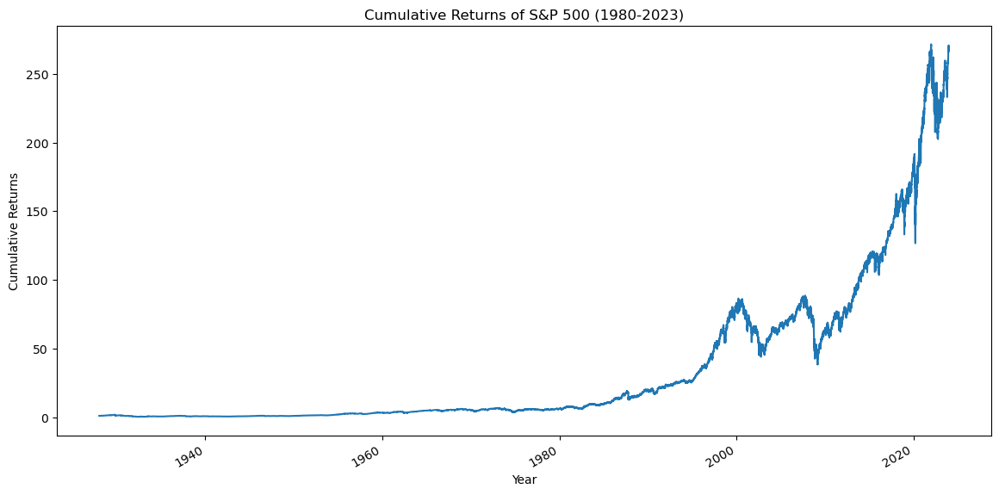

In [23]:
cumulative_returns = (1 + sp500['^GSPC'].pct_change()).cumprod()
cumulative_returns.plot(figsize=(14, 7), title='Cumulative Returns of S&P 500 (1980-2023)')
plt.xlabel('Year')
plt.ylabel('Cumulative Returns')
plt.show()


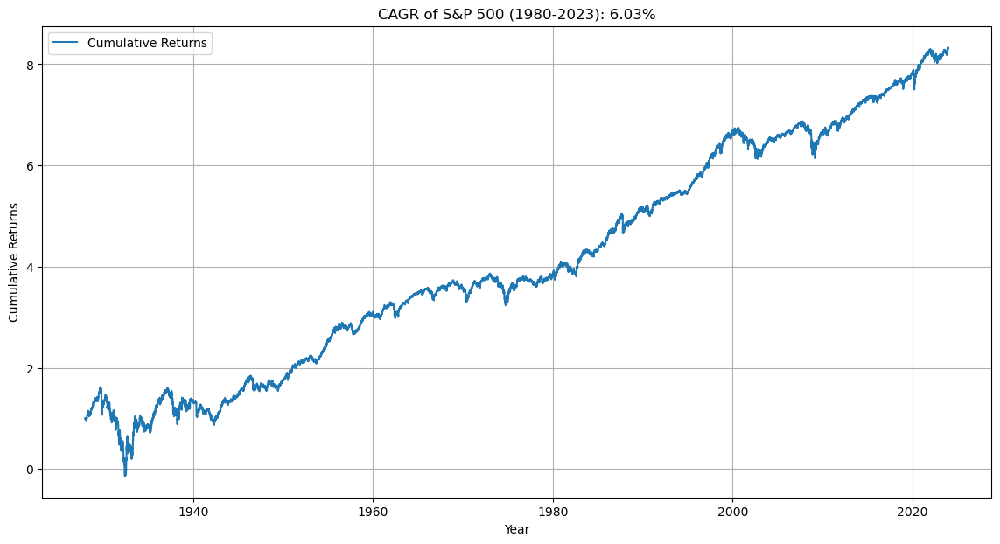

In [24]:
# Calculating CAGR
daily_returns = sp500['^GSPC'].pct_change().dropna()
start_price = sp500['^GSPC'].iloc[0]
end_price = sp500['^GSPC'].iloc[-1]
years = len(sp500) / 252  # Assuming trading days per year
cagr = ((end_price / start_price) ** (1 / years)) - 1
plt.figure(figsize=(14, 7))
plt.plot(daily_returns.index, daily_returns.cumsum() + 1, label='Cumulative Returns')
plt.title(f'CAGR of S&P 500 (1980-2023): {cagr:.2%}')
plt.xlabel('Year')
plt.ylabel('Cumulative Returns')
plt.legend()
plt.grid(True)
plt.show()


The plot demonstrates the calculation of the compound annual growth rate (CAGR) for the S&P 500 over the same period. CAGR provides a smoothed annual rate of growth, which can be more informative than simple cumulative returns, especially for comparing different investments.

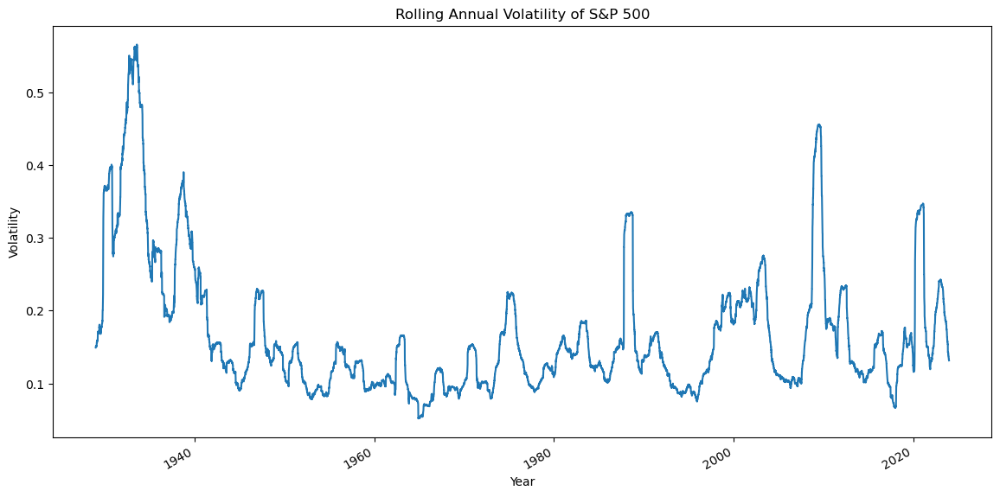

In [25]:
rolling_volatility = sp500['^GSPC'].pct_change().rolling(window=252).std() * np.sqrt(252)
rolling_volatility.plot(figsize=(14, 7), title='Rolling Annual Volatility of S&P 500')
plt.xlabel('Year')
plt.ylabel('Volatility')
plt.show()


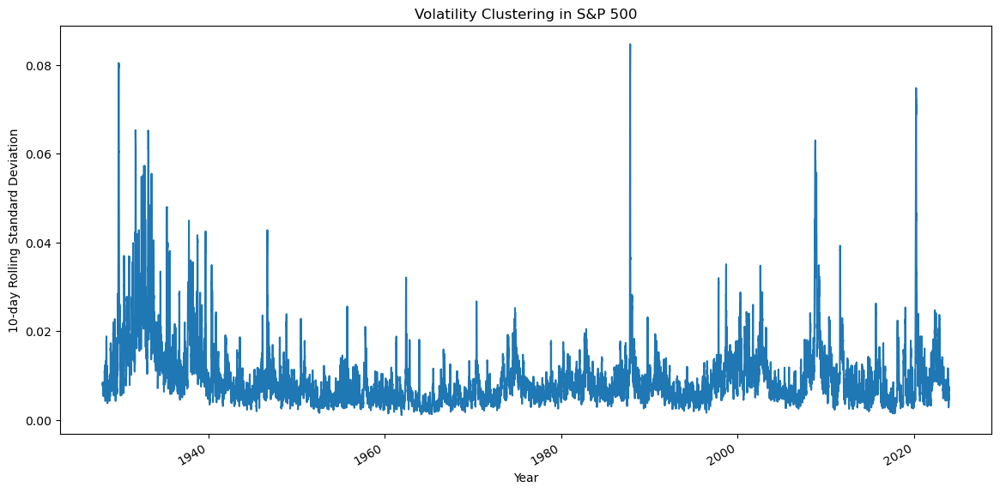

In [26]:
volatility_clusters = sp500['^GSPC'].pct_change().rolling(window=10).std()
volatility_clusters.plot(figsize=(14, 7), title='Volatility Clustering in S&P 500')

plt.xlabel('Year')
plt.ylabel('10-day Rolling Standard Deviation')
plt.show()


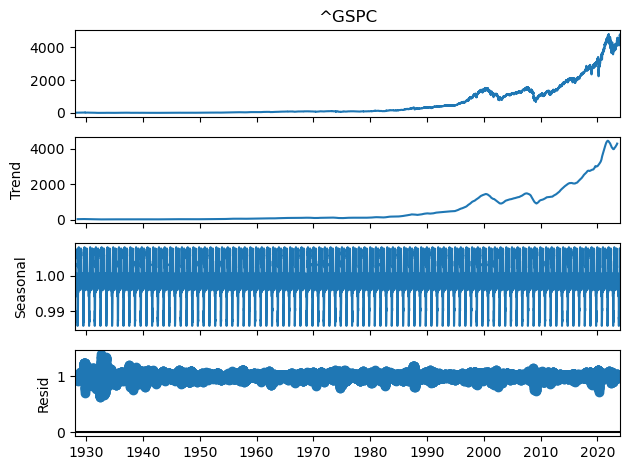

In [27]:
from statsmodels.tsa.seasonal import seasonal_decompose

result = seasonal_decompose(sp500['^GSPC'].dropna(), model='multiplicative', period=252)
result.plot()
plt.show()

In [28]:
import numpy as np

crisis_correlations = {}
crisis_betas = {}

def calculate_correlation_and_beta(crisis_start, crisis_end):
    
    crisis_returns = sp500.loc[crisis_start:crisis_end].drop('^GSPC', axis=1)
    market_returns = sp500.loc[crisis_start:crisis_end, '^GSPC']
    
    correlation_crisis = crisis_returns.corr()
    crisis_correlations[f"{crisis_start} to {crisis_end}"] = correlation_crisis
    
    betas_crisis = calculate_capm_betas(crisis_returns, market_returns)
    crisis_betas[f"{crisis_start} to {crisis_end}"] = betas_crisis

for index, row in crisis_periods.iterrows():
    crisis_start, crisis_end = row['Crisis Start'], row['Crisis End']
    calculate_correlation_and_beta(crisis_start, crisis_end)

print("\nCorrelation Matrices for Crisis Periods:")
for key, matrix in crisis_correlations.items():
    print(f"\n{key}:")
    print(matrix)

print("\nCAPM Betas for Crisis Periods:")
for key, betas in crisis_betas.items():
    print(f"\n{key}:")
    for stock, beta_value in betas.items():
        print(f"{stock}: {beta_value}")


Correlation Matrices for Crisis Periods:

1982-02-22 00:00:00 to 1982-09-14 00:00:00:
       A  AAL  AAPL  ABBV  ABNB       ABT  ACGL  ACN  ADBE       ADI  ...  \
A    NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
AAL  NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
AAPL NaN  NaN   1.0   NaN   NaN  0.434997   NaN  NaN   NaN  0.348164  ...   
ABBV NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
ABNB NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
...   ..  ...   ...   ...   ...       ...   ...  ...   ...       ...  ...   
XYL  NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
YUM  NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
ZBH  NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
ZBRA NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       NaN  ...   
ZTS  NaN  NaN   NaN   NaN   NaN       NaN   NaN  NaN   NaN       N

In [29]:
average_correlation_per_crisis = []
average_beta_per_crisis = []

for i, (crisis_start, crisis_end) in enumerate(zip(crisis_periods['Crisis Start'], crisis_periods['Crisis End']), start=1):
    
    crisis_returns = sp500.loc[crisis_start:crisis_end].drop('^GSPC', axis=1)
    market_returns = sp500.loc[crisis_start:crisis_end, '^GSPC']
    
    correlation_crisis = crisis_returns.corr().mean().mean()
    average_correlation_per_crisis.append(correlation_crisis)
    
    try:
        betas_crisis = calculate_capm_betas(crisis_returns, market_returns)
        average_beta_crisis = np.nanmean(list(betas_crisis.values()))  
        average_beta_per_crisis.append(average_beta_crisis)
    except Exception as e:
        print(f"Error calculating CAPM beta for crisis period {i}: {e}")
        average_beta_per_crisis.append(np.nan) 
print("\nAverage Correlation for Each Crisis Period:")
for i, corr in enumerate(average_correlation_per_crisis, start=1):
    print(f"Crisis {i}: {corr}")

print("\nAverage CAPM Beta for Each Crisis Period:")
for i, beta in enumerate(average_beta_per_crisis, start=1):
    print(f"Crisis {i}: {beta}")



Average Correlation for Each Crisis Period:
Crisis 1: 0.17299933634522757
Crisis 2: 0.4566887602044714
Crisis 3: 0.20399120139797355
Crisis 4: 0.3927697465900315
Crisis 5: 0.5689671357788912
Crisis 6: 0.5985317409987765
Crisis 7: 0.662853539975803
Crisis 8: 0.39798459206690706

Average CAPM Beta for Each Crisis Period:
Crisis 1: 0.0003992824081297447
Crisis 2: 0.000982487592477237
Crisis 3: 2.2833097797800887e-05
Crisis 4: 0.0001827790586097806
Crisis 5: 2.2152378059016233e-05
Crisis 6: 0.0004333703482542152
Crisis 7: 0.00025277497018529445
Crisis 8: 1.2848338606050769e-05


In [31]:
import pandas as pd

sp500_filtered = sp500['1980-01-01':'2023-12-31']

monthly_returns = sp500_filtered.drop(columns=['^GSPC']).resample('M').mean()
quarterly_returns = sp500_filtered.drop(columns=['^GSPC']).resample('Q').mean()

In [32]:
for month in monthly_returns.index:
    month_corr_matrix = sp500_filtered.loc[month.strftime('%Y-%m')].drop(columns=['^GSPC']).corr()
    print(f"\nCorrelation Matrix for {month.strftime('%Y-%m')}:")
    print(month_corr_matrix)



Correlation Matrix for 1980-01:
       A  AAL  AAPL  ABBV  ABNB  ABT  ACGL  ACN  ADBE  ADI  ...  WY  WYNN  \
A    NaN  NaN   NaN   NaN   NaN  NaN   NaN  NaN   NaN  NaN  ... NaN   NaN   
AAL  NaN  NaN   NaN   NaN   NaN  NaN   NaN  NaN   NaN  NaN  ... NaN   NaN   
AAPL NaN  NaN   NaN   NaN   NaN  NaN   NaN  NaN   NaN  NaN  ... NaN   NaN   
ABBV NaN  NaN   NaN   NaN   NaN  NaN   NaN  NaN   NaN  NaN  ... NaN   NaN   
ABNB NaN  NaN   NaN   NaN   NaN  NaN   NaN  NaN   NaN  NaN  ... NaN   NaN   
...   ..  ...   ...   ...   ...  ...   ...  ...   ...  ...  ...  ..   ...   
XYL  NaN  NaN   NaN   NaN   NaN  NaN   NaN  NaN   NaN  NaN  ... NaN   NaN   
YUM  NaN  NaN   NaN   NaN   NaN  NaN   NaN  NaN   NaN  NaN  ... NaN   NaN   
ZBH  NaN  NaN   NaN   NaN   NaN  NaN   NaN  NaN   NaN  NaN  ... NaN   NaN   
ZBRA NaN  NaN   NaN   NaN   NaN  NaN   NaN  NaN   NaN  NaN  ... NaN   NaN   
ZTS  NaN  NaN   NaN   NaN   NaN  NaN   NaN  NaN   NaN  NaN  ... NaN   NaN   

      XEL  XOM  XRAY  XYL  YUM  ZBH  ZBRA 

In [33]:
for quarter in quarterly_returns.index:
    quarter_str = f"{quarter.year}-Q{(quarter.month-1)//3 + 1}"
    quarter_corr_matrix = sp500_filtered.loc[quarter.strftime('%Y-%m')].drop(columns=['^GSPC']).corr()
    

In [34]:
import pandas as pd
import numpy as np


sp500_filtered = sp500['1980-01-01':'2023-12-31']

monthly_returns = sp500_filtered.drop(columns=['^GSPC']).resample('M').apply(lambda x: x.pct_change().mean())

average_monthly_correlations = {}

for month in monthly_returns.index:
    
    month_corr_matrix = sp500_filtered.loc[month.strftime('%Y-%m')].drop(columns=['^GSPC']).corr()
    
    
    upper_triangle = month_corr_matrix.where(np.triu(np.ones(month_corr_matrix.shape), k=1).astype(bool))
    upper_triangle_values = upper_triangle.unstack().dropna()
    
    
    average_correlation = upper_triangle_values.mean()
    
    
    average_monthly_correlations[month.strftime('%Y-%m')] = average_correlation


average_monthly_correlations_df = pd.DataFrame(list(average_monthly_correlations.items()), columns=['Month', 'Average Correlation'])


average_monthly_correlations_df.head()  

,Month,Average Correlation
0,1980-01,0.091488
1,1980-02,0.138354
2,1980-03,0.349133
3,1980-04,0.189585
4,1980-05,0.111992


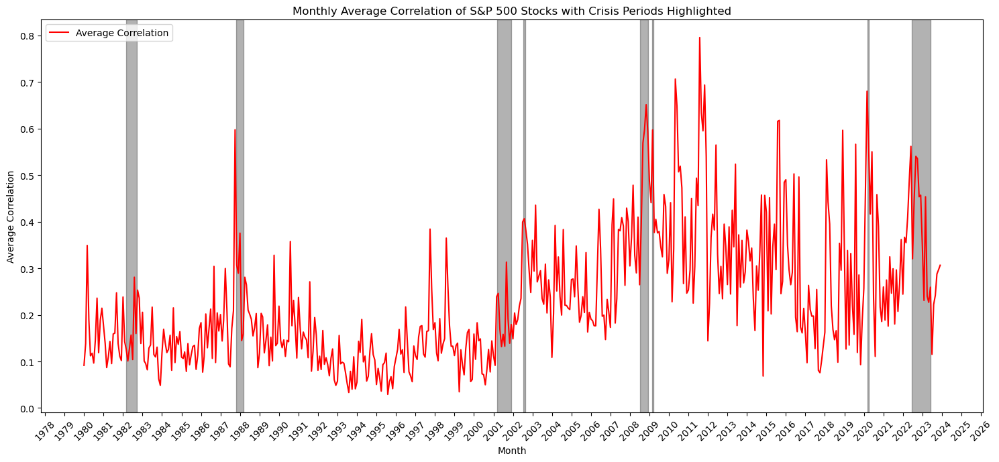

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

crisis_periods = [
    {'start': '1982-02-22', 'end': '1982-09-14'},
    {'start': '1987-10-19', 'end': '1988-03-08'},
    {'start': '2001-03-12', 'end': '2001-12-05'},
    {'start': '2002-07-10', 'end': '2002-08-22'},
    {'start': '2008-07-09', 'end': '2008-12-08'},
    {'start': '2009-02-23', 'end': '2009-03-23'},
    {'start': '2020-03-12', 'end': '2020-04-08'},
    {'start': '2022-06-13', 'end': '2023-06-08'}
]


average_monthly_correlations_df['Month'] = pd.to_datetime(average_monthly_correlations_df['Month'])

plt.figure(figsize=(15, 7))
plt.plot(average_monthly_correlations_df['Month'], average_monthly_correlations_df['Average Correlation'], linestyle='-', color='red', label='Average Correlation')


for crisis in crisis_periods:
    start_date = mdates.date2num(pd.to_datetime(crisis['start']))
    end_date = mdates.date2num(pd.to_datetime(crisis['end']))
    plt.axvspan(start_date, end_date, color='black', alpha=0.3)

plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.xticks(rotation=45)
plt.legend()

plt.title('Monthly Average Correlation of S&P 500 Stocks with Crisis Periods Highlighted')
plt.xlabel('Month')
plt.ylabel('Average Correlation')
plt.tight_layout()
plt.show()


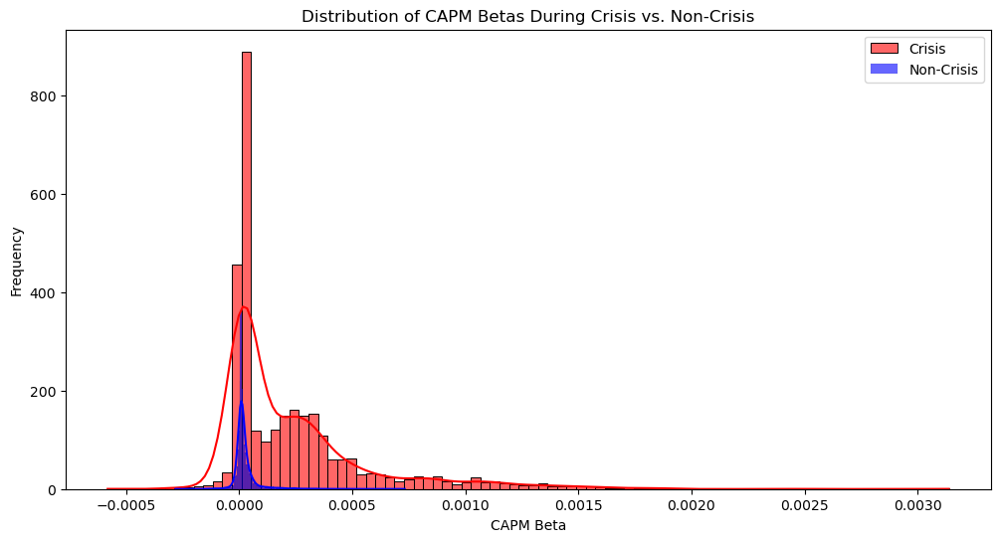

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

crisis_betas_combined = pd.Series([beta for period_betas in betas_crisis_all.values() for beta in period_betas.values()])

non_crisis_betas_combined = pd.Series([beta for period_betas in betas_non_crisis_all.values() for beta in period_betas.values()])
plt.figure(figsize=(12, 6))
sns.histplot(crisis_betas_combined, color='red', kde=True, label='Crisis', alpha=0.6)
sns.histplot(non_crisis_betas_combined, color='blue', kde=True, label='Non-Crisis', alpha=0.6)
plt.title('Distribution of CAPM Betas During Crisis vs. Non-Crisis')
plt.xlabel('CAPM Beta')
plt.ylabel('Frequency')
plt.legend()
plt.show()


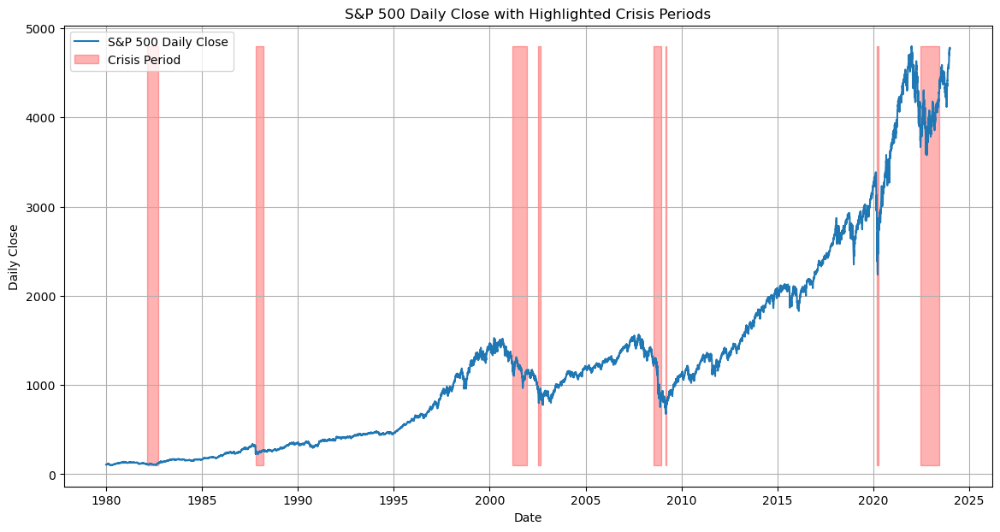

In [37]:
import matplotlib.pyplot as plt
import pandas as pd

sp500 = sp500.sort_index()

sp500 = sp500['1980-01-01':'2023-12-31']


plt.figure(figsize=(14, 7))
plt.plot(sp500.index, sp500['^GSPC'], label='S&P 500 Daily Close')

crisis_periods = [
    {'start': '1982-02-22', 'end': '1982-09-14'},
    {'start': '1987-10-19', 'end': '1988-03-08'},
    {'start': '2001-03-12', 'end': '2001-12-05'},
    {'start': '2002-07-10', 'end': '2002-08-22'},
    {'start': '2008-07-09', 'end': '2008-12-08'},
    {'start': '2009-02-23', 'end': '2009-03-23'},
    {'start': '2020-03-12', 'end': '2020-04-08'},
    {'start': '2022-06-13', 'end': '2023-06-08'}
]
crisis_periods = [{k: pd.to_datetime(v) for k, v in period.items()} for period in crisis_periods]
for period in crisis_periods:
    plt.fill_between(
        x=sp500.index, 
        y1=sp500['^GSPC'].min(), 
        y2=sp500['^GSPC'].max(), 
        where=(sp500.index >= period['start']) & (sp500.index <= period['end']),
        color='red', 
        alpha=0.3,
        label='Crisis Period' if 'Crisis Period' not in plt.gca().get_legend_handles_labels()[1] else ""
    )

plt.title('S&P 500 Daily Close with Highlighted Crisis Periods')
plt.xlabel('Date')
plt.ylabel('Daily Close')
plt.legend()
plt.grid(True)
plt.show()


In [38]:
from scipy import stats
import numpy as np

t_test_results_correlation = []
t_test_results_beta = []

for crisis_label, crisis_corr_matrix in all_correlations_crisis.items():
    
    crisis_correlation_values = crisis_corr_matrix.values[np.triu_indices_from(crisis_corr_matrix, k=1)]
    average_crisis_correlation = np.nanmean(crisis_correlation_values)
    
    
    non_crisis_correlation_values = np.concatenate(
        [matrix.values[np.triu_indices_from(matrix, k=1)] for matrix in all_correlations_non_crisis.values()]
    )
    
    
    t_stat_corr, p_value_corr = stats.ttest_ind(crisis_correlation_values, non_crisis_correlation_values, nan_policy='omit', equal_var=False)
    t_test_results_correlation.append((crisis_label, t_stat_corr, p_value_corr))
    
    
    crisis_betas_values = list(betas_crisis_all[crisis_label].values())
    
    
    non_crisis_betas_values = np.concatenate(
        [list(betas.values()) for betas in betas_non_crisis_all.values()]
    )
    
    
    t_stat_beta, p_value_beta = stats.ttest_ind(crisis_betas_values, non_crisis_betas_values, nan_policy='omit', equal_var=False)
    t_test_results_beta.append((crisis_label, t_stat_beta, p_value_beta))


print("T-test results for Average Correlation:")
for label, t_stat, p_value in t_test_results_correlation:
    print(f"{label}: T-statistic = {t_stat}, P-value = {p_value}")

print("\nT-test results for Average CAPM Beta:")
for label, t_stat, p_value in t_test_results_beta:
    print(f"{label}: T-statistic = {t_stat}, P-value = {p_value}")


T-test results for Average Correlation:
Crisis 1: T-statistic = -162.54651964999917, P-value = 0.0
Crisis 2: T-statistic = 109.19840160469944, P-value = 0.0
Crisis 3: T-statistic = -205.53397094729863, P-value = 0.0
Crisis 4: T-statistic = 79.97176423182484, P-value = 0.0
Crisis 5: T-statistic = 528.1909406135899, P-value = 0.0
Crisis 6: T-statistic = 420.9302381177155, P-value = 0.0
Crisis 7: T-statistic = 573.3445385291751, P-value = 0.0
Crisis 8: T-statistic = 147.41814204477436, P-value = 0.0

T-test results for Average CAPM Beta:
Crisis 1: T-statistic = 13.80258119796394, P-value = 1.274542581072794e-30
Crisis 2: T-statistic = 38.278453671690784, P-value = 1.1809940269453854e-103
Crisis 3: T-statistic = -1.4854607144218204, P-value = 0.13776451123446537
Crisis 4: T-statistic = 12.144674489492342, P-value = 5.338145374858453e-29
Crisis 5: T-statistic = -2.4611541127639076, P-value = 0.013922435601545685
Crisis 6: T-statistic = 30.471183903677332, P-value = 2.5306873742892864e-110
C

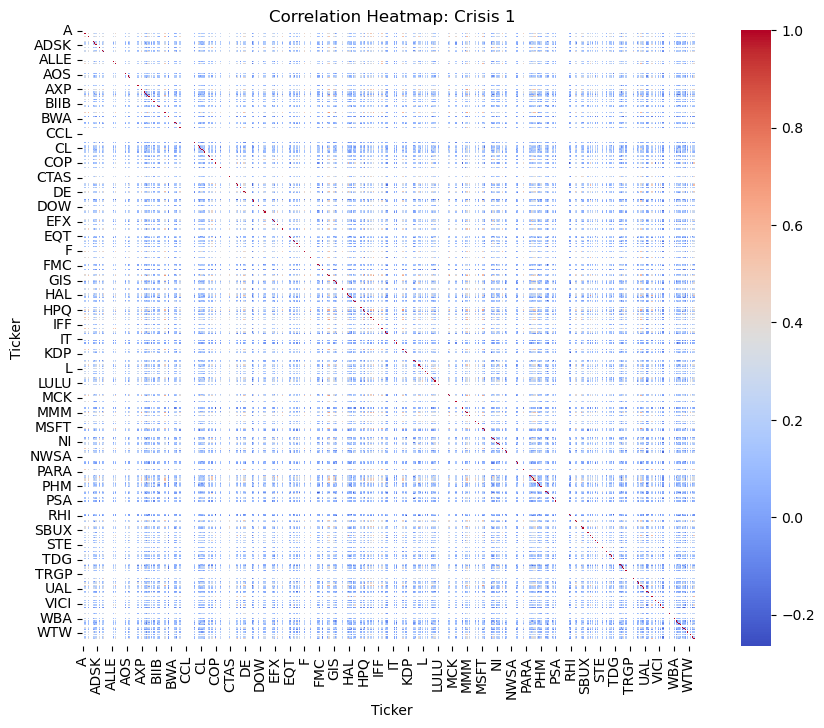

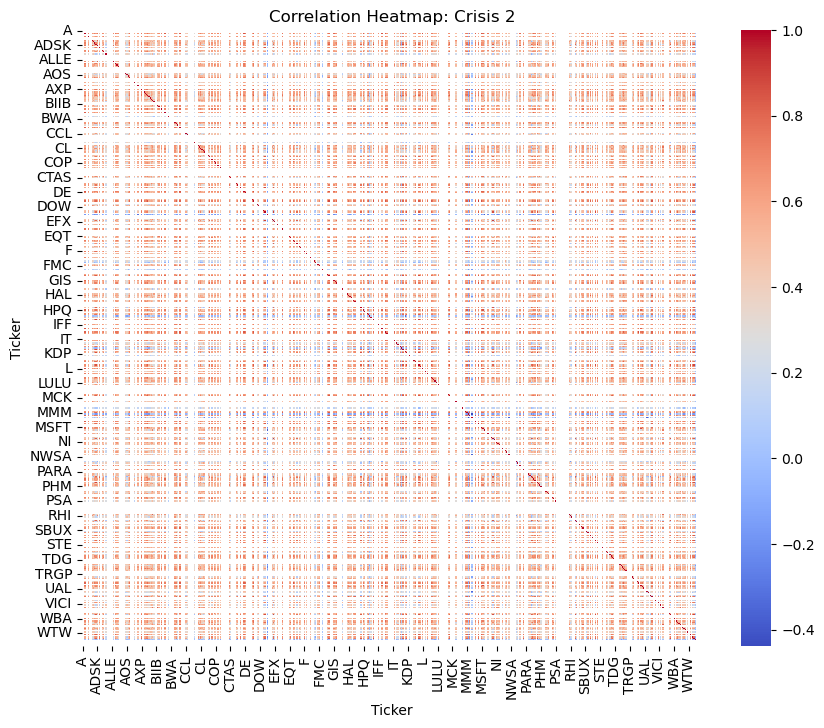

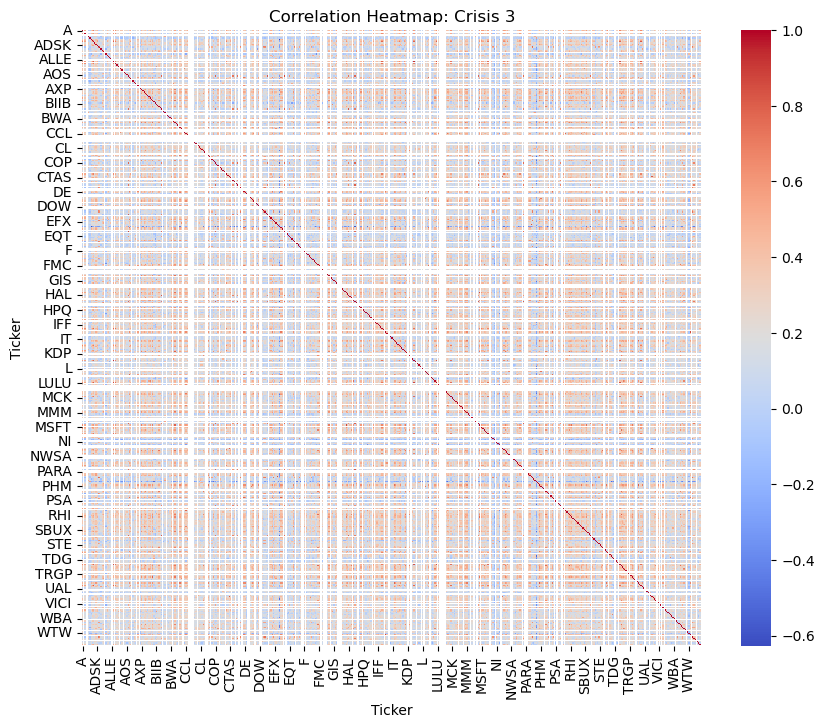

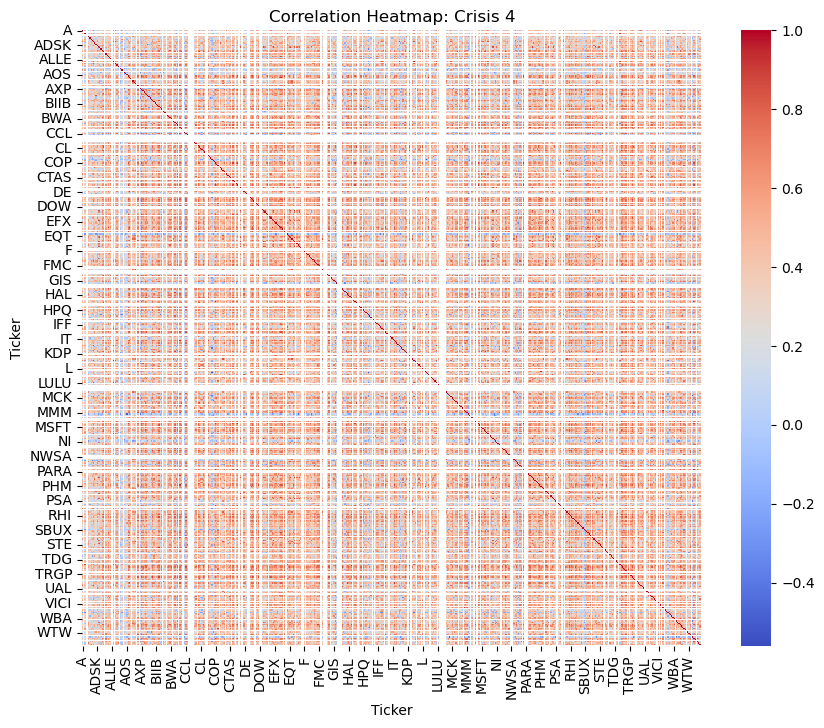

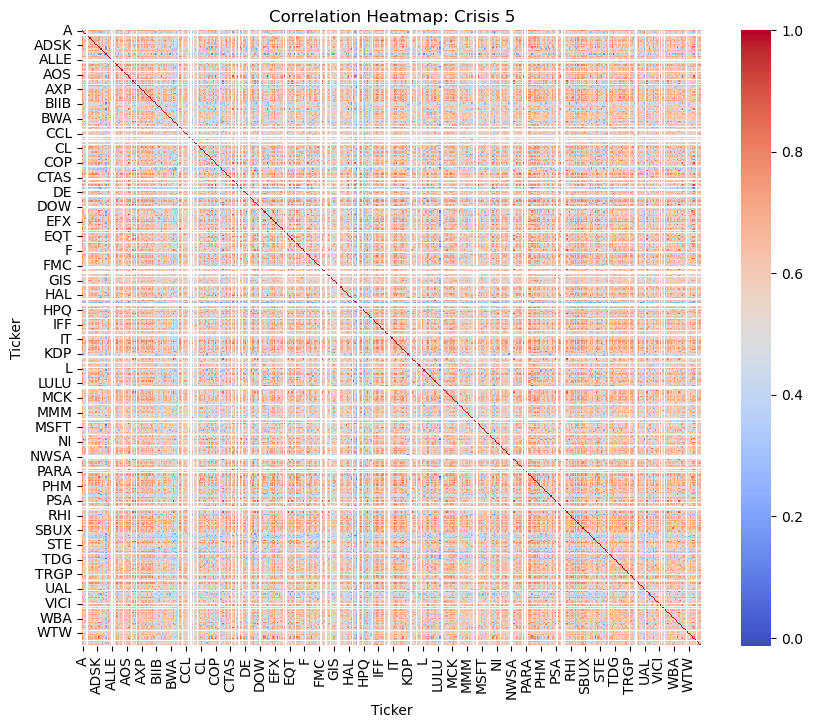

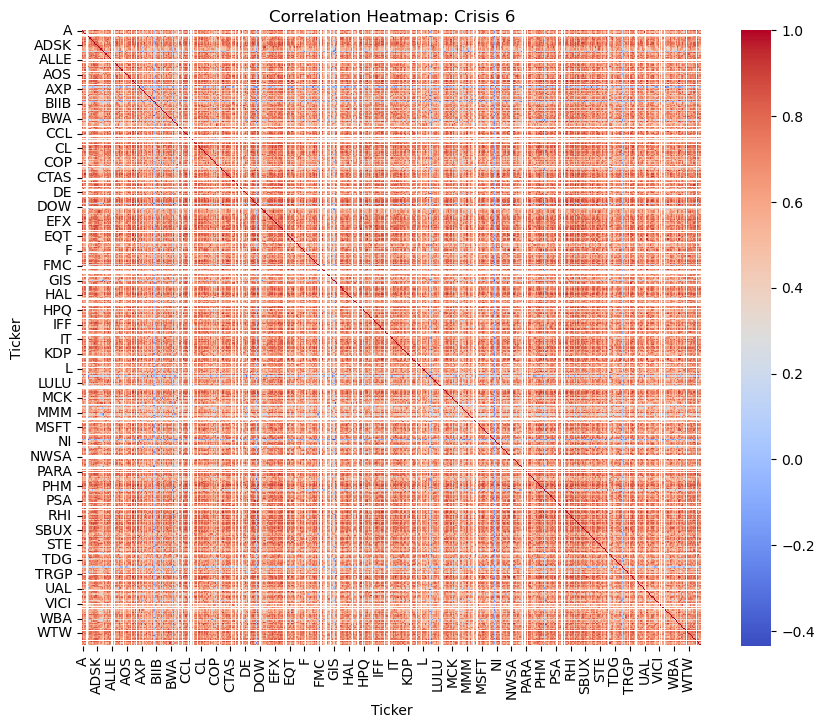

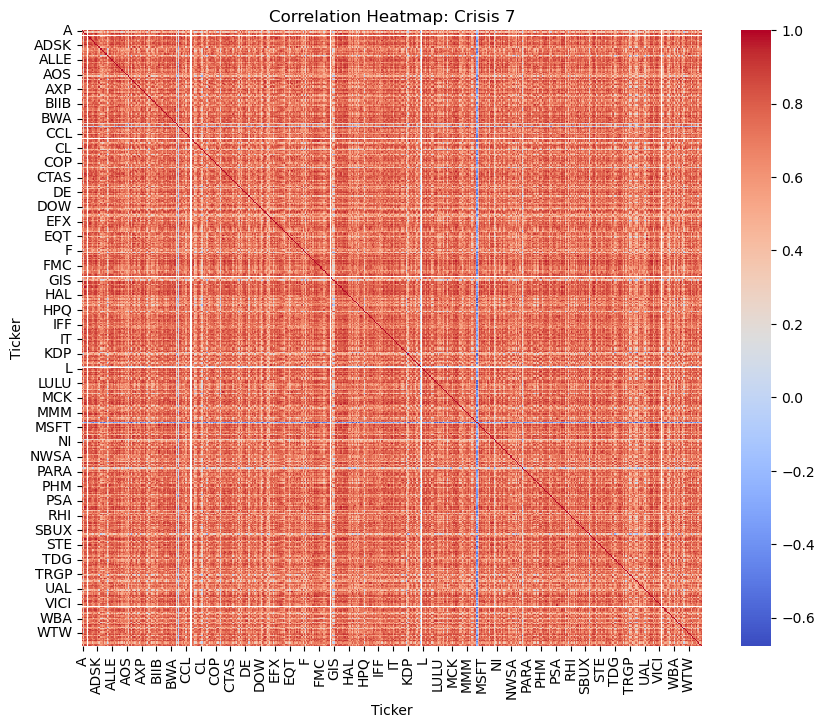

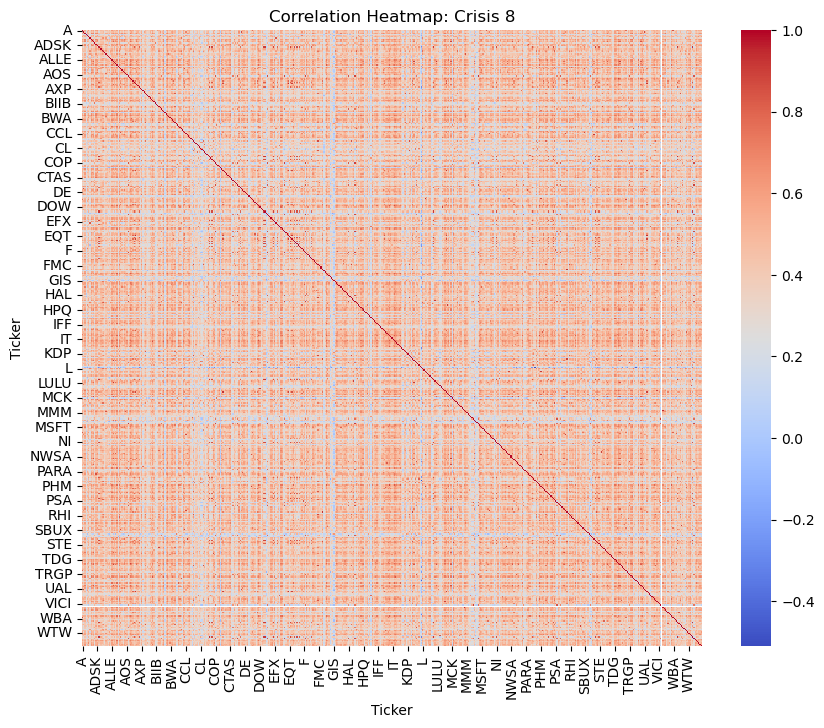

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt


for crisis_label, correlation_matrix in all_correlations_crisis.items():
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', cbar=True)
    plt.title(f'Correlation Heatmap: {crisis_label}')
    plt.show()


In [40]:
daily_returns = sp500['^GSPC'].pct_change()


In [41]:
monthly_variance = daily_returns.resample('M').var()
monthly_covariance = sp500.iloc[:,:-2].resample('M').apply(lambda x: x.cov(daily_returns))
average_monthly_beta = monthly_covariance.div(monthly_variance, axis=0).mean(axis=1)

C:\Users\vishw\anaconda3\Lib\site-packages\pandas\core\nanops.py:1671: RuntimeWarning: Degrees of freedom <= 0 for slice
  return np.cov(a, b, ddof=ddof)[0, 1]
C:\Users\vishw\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2705: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)


In [42]:
print(average_monthly_beta)

Date
1980-01-31    0.757791
1980-02-29    0.695725
1980-03-31    0.988461
1980-04-30    0.797443
1980-05-31    0.674745
                ...   
2023-08-31    0.790175
2023-09-30    0.875862
2023-10-31    0.928019
2023-11-30    1.166282
2023-12-31    1.190653
Freq: M, Length: 528, dtype: float64


In [43]:

average_monthly_beta_df = pd.DataFrame(list(average_monthly_beta.items()), columns=['Month', 'Average CAPM Beta'])

average_monthly_beta_df.head() 

,Month,Average CAPM Beta
0,1980-01-31,0.757791
1,1980-02-29,0.695725
2,1980-03-31,0.988461
3,1980-04-30,0.797443
4,1980-05-31,0.674745


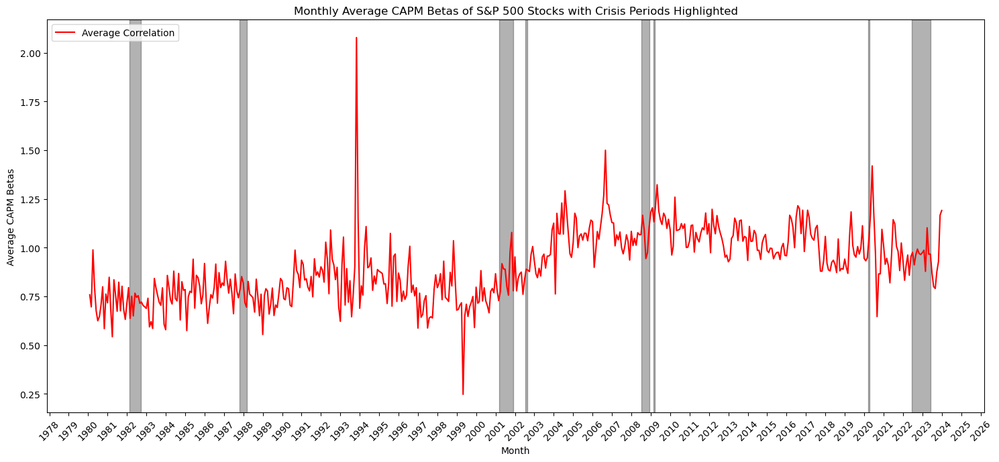

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

crisis_periods = [
    {'start': '1982-02-22', 'end': '1982-09-14'},
    {'start': '1987-10-19', 'end': '1988-03-08'},
    {'start': '2001-03-12', 'end': '2001-12-05'},
    {'start': '2002-07-10', 'end': '2002-08-22'},
    {'start': '2008-07-09', 'end': '2008-12-08'},
    {'start': '2009-02-23', 'end': '2009-03-23'},
    {'start': '2020-03-12', 'end': '2020-04-08'},
    {'start': '2022-06-13', 'end': '2023-06-08'}
]

average_monthly_beta_df['Month'] = pd.to_datetime(average_monthly_beta_df['Month'])

plt.figure(figsize=(15, 7))
plt.plot(average_monthly_beta_df['Month'], average_monthly_beta_df['Average CAPM Beta'], linestyle='-', color='red', label='Average Correlation')
for crisis in crisis_periods:
    start_date = mdates.date2num(pd.to_datetime(crisis['start']))
    end_date = mdates.date2num(pd.to_datetime(crisis['end']))
    plt.axvspan(start_date, end_date, color='black', alpha=0.3)

plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.xticks(rotation=45)
plt.legend()

plt.title('Monthly Average CAPM Betas of S&P 500 Stocks with Crisis Periods Highlighted')
plt.xlabel('Month')
plt.ylabel('Average CAPM Betas')
plt.tight_layout()
plt.show()